# Vocoder fine-tune data QA — Arioso mel vs GT mel

Before fine-tuning the BigVGAN vocoder on Arioso-generated mels, this notebook audits the
`Data/datasets/vocoder_ft/` chunks: it reconstructs full mels from the `_a` (Arioso) / `_g` (GT)
chunk pairs, plots delta-mel heatmaps (coolwarm +/-2, matching `Arioso/eval/metrics._delta_plot`),
computes per-mel-bin and per-frame error statistics + MCD, checks for a train-vs-val leakage gap
(Arioso saw the train pieces during its own training), and lays down a pre-fine-tune **listening
baseline**: GT audio vs `vocode(GT mel)` vs `vocode(Arioso mel)`.

The `_g` chunks are exact slices of `gt_arky/target_mel/<base>.npy` (verified below), so any
`Arioso - GT` delta is pure model transport error, not a grid/alignment artifact. Nothing outside
this notebook and `test notebooks/figs/` is touched.

## 1 - Setup

In [1]:
%matplotlib inline
import os, sys, json, glob, random
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Markdown, Audio

# Notebook lives in test notebooks/; hop up to the project root so common/ Arioso/ import
# (same convention as the other test notebooks).
if not os.path.isdir("Arioso") and os.path.isdir(os.path.join("..", "Arioso")):
    os.chdir("..")
_root = os.path.abspath(os.getcwd())
if _root not in sys.path:
    sys.path.insert(0, _root)

# MCD: reuse the project's implementation if importable, else inline-port it.
try:
    from Arioso.eval.metrics import mcd
    print("imported mcd from Arioso.eval.metrics")
except Exception as e:
    from scipy.fft import dct
    _MCD_K = 24
    _MCD_COEF = 10.0 / np.log(10.0)
    def mcd(a, b):
        t = min(a.shape[-1], b.shape[-1])
        ca = dct(a[:, :t], type=2, norm="ortho", axis=0)[1:_MCD_K + 1]
        cb = dct(b[:, :t], type=2, norm="ortho", axis=0)[1:_MCD_K + 1]
        per_frame = np.sqrt(2.0 * np.sum((ca - cb) ** 2, axis=0))
        return float(_MCD_COEF * per_frame.mean())
    print("inline-ported mcd (Arioso import failed:", repr(e), ")")

DATA   = os.path.join("Data", "datasets", "vocoder_ft")
AMEL   = os.path.join(DATA, "arioso_mel")           # _a### Arioso, _g### GT chunks
WAVS   = os.path.join(DATA, "wavs_nonspeech")       # _a###.wav GT audio chunks
GT_TM  = os.path.join("Data", "datasets", "gt_arky", "target_mel")
GT_WAV = os.path.join("Data", "datasets", "gt_arky", "gt")
FIGS   = os.path.join("test notebooks", "figs")
AB_DIR = os.path.join(FIGS, "vocoder_ab_baseline")
os.makedirs(FIGS, exist_ok=True)
os.makedirs(AB_DIR, exist_ok=True)

meta = json.load(open(os.path.join(DATA, "build_meta.json")))
BASES = meta["bases"]
print("keys:", list(meta.keys()))
print("n bases:", len(BASES))

def split_of(b): return BASES[b]["split"]
def n_a_chunks(b): return sum(1 for c in BASES[b]["chunks"] if "_a" in c)

train_bases = sorted(b for b in BASES if split_of(b) == "train")
val_bases   = sorted(b for b in BASES if split_of(b) == "val")
print("val bases:", val_bases)
print("n train:", len(train_bases), " n val:", len(val_bases))

# Chosen bases for the detailed views: the 2 val bases + 2 high-chunk-count train bases
# (a Kreutzer and a Suzuki3), so the qualitative panels span books.
CHOSEN = val_bases + ["Kreutzer00000152", "Suzuki3_1_00000143"]
CHOSEN = [b for b in CHOSEN if b in BASES]
print("chosen:", [(b, split_of(b), n_a_chunks(b)) for b in CHOSEN])


imported mcd from Arioso.eval.metrics
keys: ['provenance', 'bases']
n bases: 37
val bases: ['Suzuki1_1_00007858', 'Suzuki1_3_00000049']
n train: 35  n val: 2
chosen: [('Suzuki1_1_00007858', 'val', 5), ('Suzuki1_3_00000049', 'val', 10), ('Kreutzer00000152', 'train', 13), ('Suzuki3_1_00000143', 'train', 28)]


## 2 - Reconstruct full mels

Concatenate the per-base `_a###` chunks in index order into the full Arioso mel, and the `_g###`
chunks into the full GT mel. As a chunking-integrity check, the `_g` route is compared against
`gt_arky/target_mel/<base>.npy` for one base (they should match exactly - the `_g` chunks are
slices of that array on the hop-512 grid).

In [2]:
def chunk_paths(base, tag):
    """Sorted list of chunk .npy paths for base, tag in {'a','g'}."""
    ps = glob.glob(os.path.join(AMEL, f"{base}_{tag}[0-9][0-9][0-9].npy"))
    return sorted(ps)

def reconstruct(base, tag):
    """Full mel [128, T] by concatenating _<tag>### chunks in index order."""
    ps = chunk_paths(base, tag)
    assert ps, f"no {tag} chunks for {base}"
    parts = [np.load(p) for p in ps]
    return np.concatenate(parts, axis=1)

# Chunking-integrity assert on one base: _g route == on-disk target_mel (trimmed to same T).
_b = CHOSEN[0]
_g = reconstruct(_b, "g")
_tm = np.load(os.path.join(GT_TM, _b + ".npy"))
_T = min(_g.shape[-1], _tm.shape[-1])
assert _g.shape[-1] == _tm.shape[-1], (_b, _g.shape, _tm.shape)
assert np.allclose(_g[:, :_T], _tm[:, :_T], atol=1e-4), np.abs(_g[:, :_T] - _tm[:, :_T]).max()
print(f"chunking OK: {_b} _g route == gt_arky target_mel  (T={_g.shape[-1]}, "
      f"maxdiff={np.abs(_g[:, :_T] - _tm[:, :_T]).max():.2e})")

# Reconstruct full a/g mels for the chosen bases; assert equal frame counts.
full = {}
for b in CHOSEN:
    a = reconstruct(b, "a"); g = reconstruct(b, "g")
    assert a.shape == g.shape, (b, a.shape, g.shape)
    full[b] = (a, g)
    print(f"{b:22s} split={split_of(b):5s} mel shape={a.shape}  n_frames(meta)={BASES[b]['n_frames']}")


chunking OK: Suzuki1_1_00007858 _g route == gt_arky target_mel  (T=2544, maxdiff=0.00e+00)
Suzuki1_1_00007858     split=val   mel shape=(128, 2544)  n_frames(meta)=2544
Suzuki1_3_00000049     split=val   mel shape=(128, 5110)  n_frames(meta)=5110
Kreutzer00000152       split=train mel shape=(128, 6431)  n_frames(meta)=6431
Suzuki3_1_00000143     split=train mel shape=(128, 14323)  n_frames(meta)=14323


## 3 - Delta-mel heatmaps

Per chosen base: GT mel (top), Arioso mel (middle) with the default cmap; the `Arioso - GT` delta
(bottom) with coolwarm at +/-2, the project's standard delta scale. Red = Arioso over-energetic,
blue = under. Saved to `test notebooks/figs/vocoder_delta_<base>.png`.

### Suzuki1_1_00007858  `[val]`  ->  `test notebooks\figs\vocoder_delta_Suzuki1_1_00007858.png`

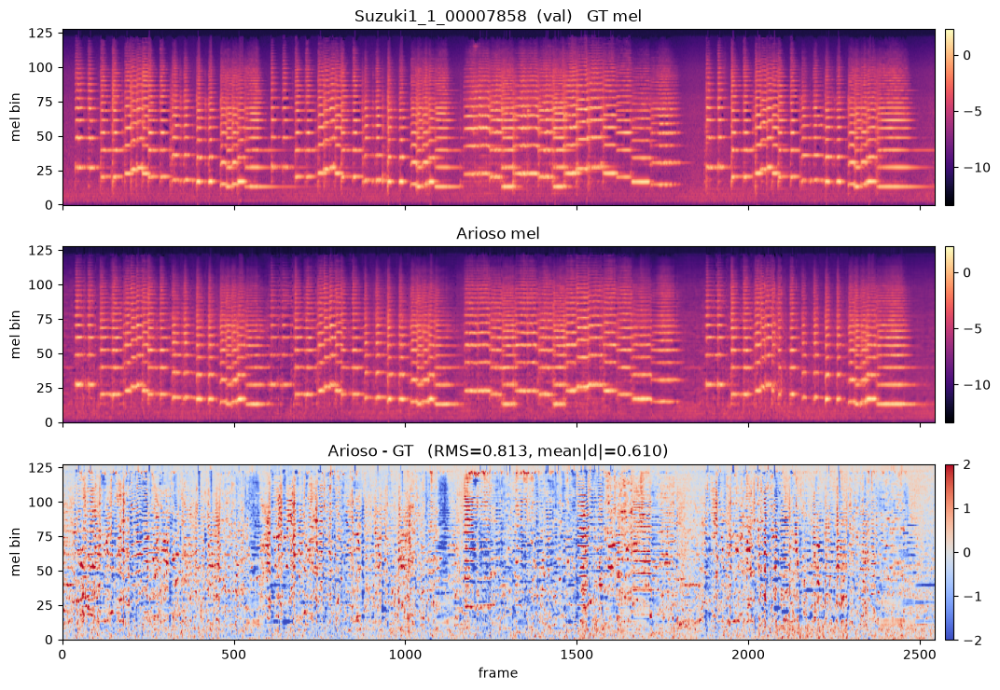

### Suzuki1_3_00000049  `[val]`  ->  `test notebooks\figs\vocoder_delta_Suzuki1_3_00000049.png`

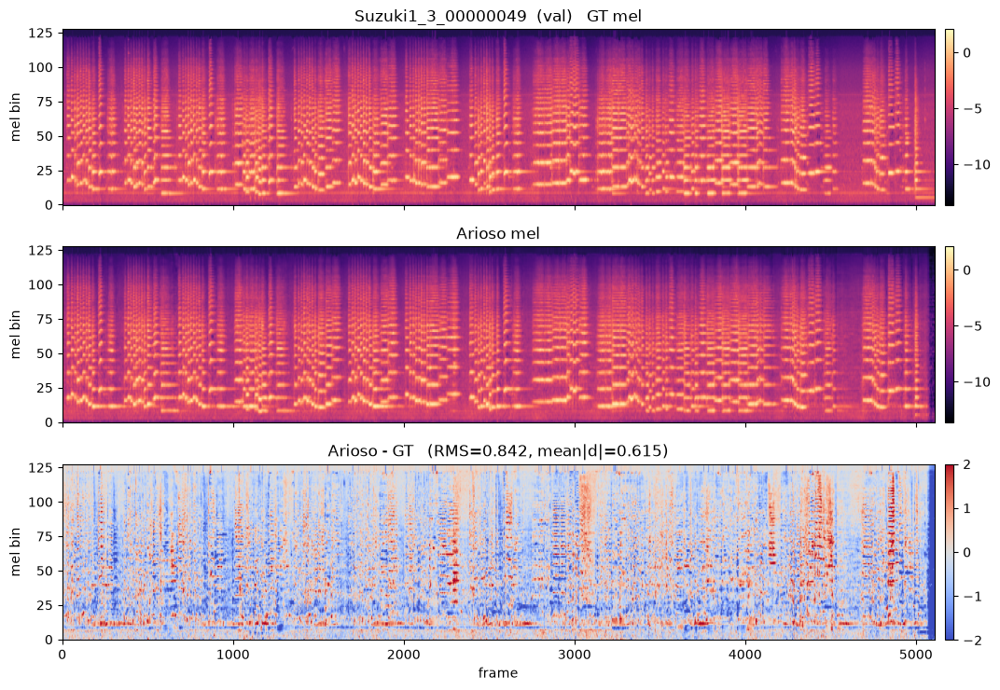

### Kreutzer00000152  `[train]`  ->  `test notebooks\figs\vocoder_delta_Kreutzer00000152.png`

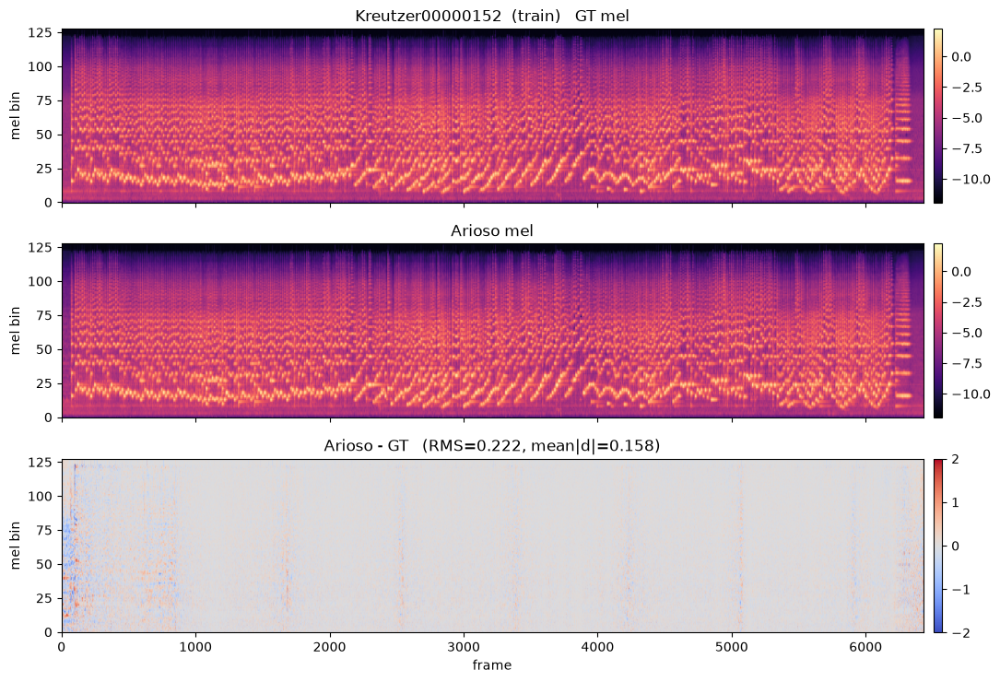

### Suzuki3_1_00000143  `[train]`  ->  `test notebooks\figs\vocoder_delta_Suzuki3_1_00000143.png`

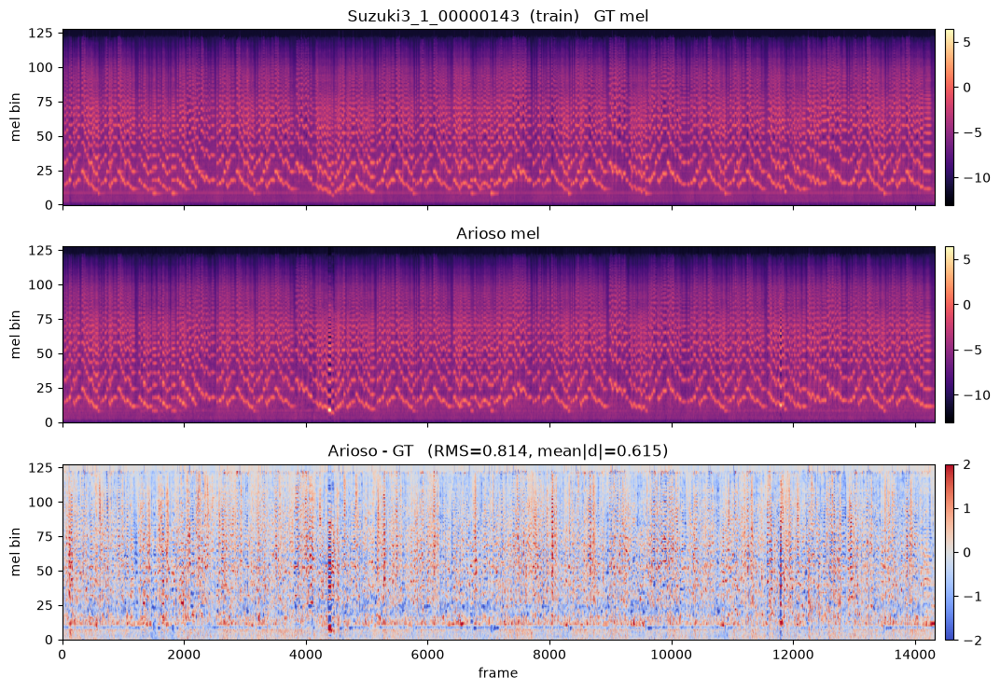

In [3]:
for b in CHOSEN:
    a, g = full[b]
    delta = a - g
    T = a.shape[-1]
    fig, axes = plt.subplots(3, 1, figsize=(12, 7.5), sharex=True)
    vmax = max(g.max(), a.max()); vmin = min(g.min(), a.min())
    im0 = axes[0].imshow(g, origin="lower", aspect="auto", cmap="magma", vmin=vmin, vmax=vmax)
    axes[0].set_title(f"{b}  ({split_of(b)})   GT mel"); axes[0].set_ylabel("mel bin")
    fig.colorbar(im0, ax=axes[0], pad=0.01)
    im1 = axes[1].imshow(a, origin="lower", aspect="auto", cmap="magma", vmin=vmin, vmax=vmax)
    axes[1].set_title("Arioso mel"); axes[1].set_ylabel("mel bin")
    fig.colorbar(im1, ax=axes[1], pad=0.01)
    im2 = axes[2].imshow(delta, origin="lower", aspect="auto", cmap="coolwarm", vmin=-2, vmax=2)
    axes[2].set_title(f"Arioso - GT   (RMS={np.sqrt(np.mean(delta**2)):.3f}, "
                      f"mean|d|={np.mean(np.abs(delta)):.3f})")
    axes[2].set_ylabel("mel bin"); axes[2].set_xlabel("frame")
    fig.colorbar(im2, ax=axes[2], pad=0.01)
    fig.tight_layout()
    outp = os.path.join(FIGS, f"vocoder_delta_{b}.png")
    fig.savefig(outp, dpi=100, bbox_inches="tight")
    display(Markdown(f"### {b}  `[{split_of(b)}]`  ->  `{outp}`"))
    display(fig); plt.close(fig)


## 4 - Error statistics (all bases)

Sweep **every** base in `build_meta`, accumulating chunkwise (one `_a`/`_g` chunk pair in memory
at a time) so peak memory stays small. We build the per-mel-bin `mean|delta|` and `RMS(delta)`
profiles (x = mel bin), a per-frame `mean|delta|` trace for one base (x = time), a subsampled
histogram of raw delta values, and per-base MCD. A compact summary table is printed.

In [4]:
N_MELS = 128
abs_sum = np.zeros(N_MELS, dtype=np.float64)   # sum |delta| over all frames, per bin
sq_sum  = np.zeros(N_MELS, dtype=np.float64)   # sum delta^2 over all frames, per bin
tot_frames = 0
hist_samples = []                              # subsampled raw delta values
rng = np.random.default_rng(0)
per_base = []                                  # (base, split, nframes, mean|d|, rms, mcd)

for b in sorted(BASES):
    ap = chunk_paths(b, "a"); gp = chunk_paths(b, "g")
    assert len(ap) == len(gp), (b, len(ap), len(gp))
    b_abs = np.zeros(N_MELS); b_sq = np.zeros(N_MELS); b_frames = 0
    a_full = []; g_full = []                    # kept only to compute per-base MCD
    for pa, pg in zip(ap, gp):
        a = np.load(pa); g = np.load(pg)
        d = a - g
        b_abs += np.abs(d).sum(axis=1)
        b_sq  += (d ** 2).sum(axis=1)
        b_frames += d.shape[1]
        # subsample ~2000 delta values per chunk for the histogram
        flat = d.ravel()
        idx = rng.integers(0, flat.size, size=min(2000, flat.size))
        hist_samples.append(flat[idx])
        a_full.append(a); g_full.append(g)
    abs_sum += b_abs; sq_sum += b_sq; tot_frames += b_frames
    a_full = np.concatenate(a_full, axis=1); g_full = np.concatenate(g_full, axis=1)
    m = mcd(a_full, g_full)
    per_base.append((b, split_of(b), b_frames,
                     float(b_abs.sum() / (b_frames * N_MELS)),
                     float(np.sqrt(b_sq.sum() / (b_frames * N_MELS))), m))

per_bin_mean_abs = abs_sum / tot_frames
per_bin_rms      = np.sqrt(sq_sum / tot_frames)
overall_mean_abs = float(abs_sum.sum() / (tot_frames * N_MELS))
overall_rms      = float(np.sqrt(sq_sum.sum() / (tot_frames * N_MELS)))
hist_samples = np.concatenate(hist_samples)
print(f"total frames across {len(BASES)} bases: {tot_frames}")
print(f"overall mean|delta| = {overall_mean_abs:.4f}   overall RMS(delta) = {overall_rms:.4f}")


total frames across 37 bases: 163595
overall mean|delta| = 0.4859   overall RMS(delta) = 0.7012


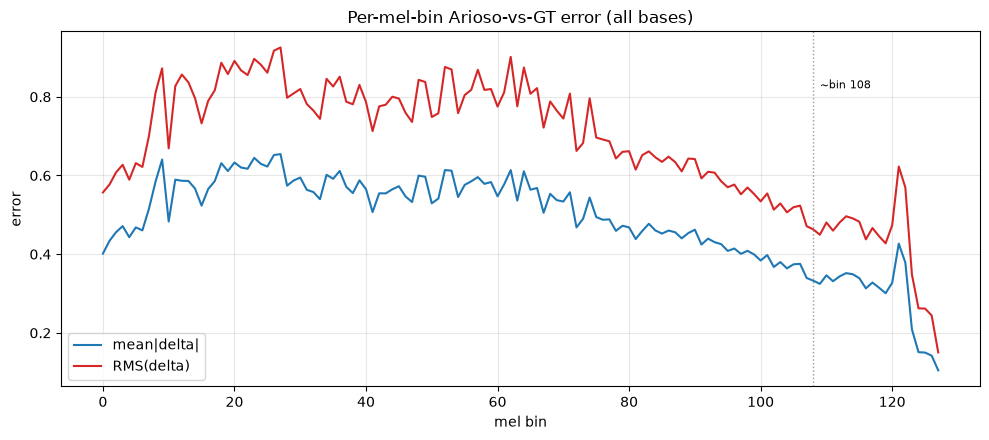

top-bin (120-127) mean|d|: [0.327 0.427 0.378 0.209 0.151 0.15  0.142 0.105]


In [5]:
# Per-mel-bin profiles
fig, ax = plt.subplots(figsize=(10, 4.5))
bins = np.arange(N_MELS)
ax.plot(bins, per_bin_mean_abs, label="mean|delta|", color="C0")
ax.plot(bins, per_bin_rms, label="RMS(delta)", color="C3")
ax.axvline(108, color="0.6", ls=":", lw=1); ax.text(109, ax.get_ylim()[1]*0.85, "~bin 108", fontsize=8)
ax.set_xlabel("mel bin"); ax.set_ylabel("error"); ax.set_title("Per-mel-bin Arioso-vs-GT error (all bases)")
ax.legend(); ax.grid(alpha=0.3)
fig.tight_layout(); fig.savefig(os.path.join(FIGS, "vocoder_per_bin_error.png"), dpi=120)
display(fig); plt.close(fig)
print("top-bin (120-127) mean|d|:", np.round(per_bin_mean_abs[120:], 3))


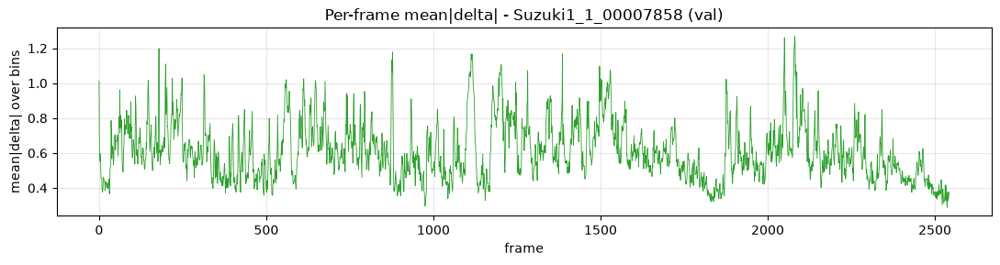

In [6]:
# Per-frame mean|delta| trace for one example base (first chosen)
eb = CHOSEN[0]
a, g = full[eb]
pf = np.abs(a - g).mean(axis=0)
fig, ax = plt.subplots(figsize=(11, 3))
ax.plot(pf, lw=0.6, color="C2")
ax.set_xlabel("frame"); ax.set_ylabel("mean|delta| over bins")
ax.set_title(f"Per-frame mean|delta| - {eb} ({split_of(eb)})")
ax.grid(alpha=0.3)
fig.tight_layout(); fig.savefig(os.path.join(FIGS, "vocoder_per_frame_example.png"), dpi=120)
display(fig); plt.close(fig)


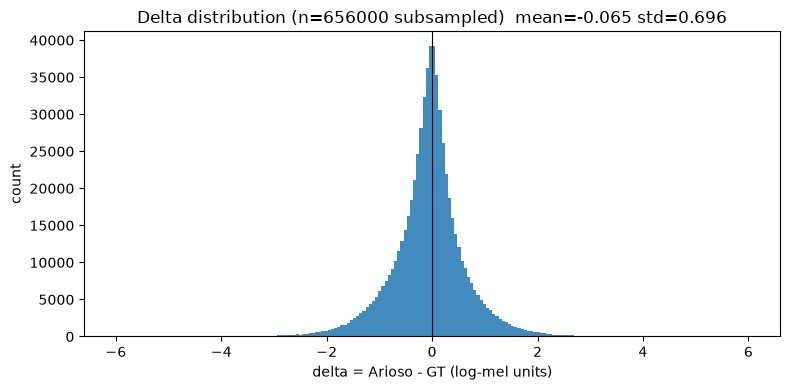

delta bias (mean) = -0.0646   std = 0.6961


In [7]:
# Histogram of raw delta values (subsampled)
fig, ax = plt.subplots(figsize=(8, 4))
ax.hist(hist_samples, bins=200, range=(-6, 6), color="C0", alpha=0.85)
ax.set_xlabel("delta = Arioso - GT (log-mel units)"); ax.set_ylabel("count")
ax.set_title(f"Delta distribution (n={hist_samples.size} subsampled)  "
             f"mean={hist_samples.mean():+.3f} std={hist_samples.std():.3f}")
ax.axvline(0, color="k", lw=0.8)
fig.tight_layout(); fig.savefig(os.path.join(FIGS, "vocoder_delta_hist.png"), dpi=120)
display(fig); plt.close(fig)
print(f"delta bias (mean) = {hist_samples.mean():+.4f}   std = {hist_samples.std():.4f}")


In [8]:
import pandas as pd
pb = pd.DataFrame(per_base, columns=["base", "split", "n_frames", "mean_abs", "rms", "mcd"])
# MCD for the chosen bases (full mels) - highlight
chosen_tbl = pb[pb["base"].isin(CHOSEN)][["base", "split", "n_frames", "mean_abs", "rms", "mcd"]]
display(Markdown("### MCD + error for chosen bases (full mels)"))
display(chosen_tbl.round(4))
display(Markdown("### Aggregate by split"))
agg = pb.groupby("split").apply(
    lambda d: pd.Series({
        "n_bases": len(d),
        "frames": int(d["n_frames"].sum()),
        # frame-weighted mean|delta|
        "mean_abs_w": np.average(d["mean_abs"], weights=d["n_frames"]),
        "mcd_mean": d["mcd"].mean(),
    }), include_groups=False)
display(agg.round(4))
pb.round(5).to_csv(os.path.join(FIGS, "vocoder_per_base_stats.csv"), index=False)
print("wrote", os.path.join(FIGS, "vocoder_per_base_stats.csv"))


### MCD + error for chosen bases (full mels)

,base,split,n_frames,mean_abs,rms,mcd
0,Kreutzer00000152,train,6431,0.1575,0.2224,7.6655
10,Suzuki1_1_00007858,val,2544,0.6101,0.8131,32.4271
20,Suzuki1_3_00000049,val,5110,0.6147,0.8422,31.8355
34,Suzuki3_1_00000143,train,14323,0.6153,0.8144,32.8124


### Aggregate by split

,n_bases,frames,mean_abs_w,mcd_mean
split,,,,
train,35.0,155941.0,0.4797,21.7323
val,2.0,7654.0,0.6131,32.1313


wrote test notebooks\figs\vocoder_per_base_stats.csv


## 5 - Leakage probe (train vs val)

Arioso trained on the train pieces, so its generated mels should sit slightly **closer** to GT on
train than on val. We aggregate `mean|delta|` (frame-weighted, chunkwise) and MCD over **all** train
bases vs **all** val bases. A small val-worse gap is expected and benign; a large gap would warn
that fine-tuning on train-heavy Arioso mels teaches the vocoder an Arioso artifact that won't hold
on unseen material.

In [9]:
def group_stats(bases):
    d = pb[pb["base"].isin(bases)]
    mean_abs_w = float(np.average(d["mean_abs"], weights=d["n_frames"]))
    return mean_abs_w, float(d["mcd"].mean()), int(d["n_frames"].sum()), len(d)

tr = group_stats(train_bases); va = group_stats(val_bases)
leak = pd.DataFrame(
    [["train", tr[3], tr[2], tr[0], tr[1]], ["val", va[3], va[2], va[0], va[1]]],
    columns=["split", "n_bases", "frames", "mean_abs_w", "mcd_mean"])
display(leak.round(4))
gap_abs = va[0] - tr[0]; gap_mcd = va[1] - tr[1]
print(f"val - train  mean|delta| gap = {gap_abs:+.4f}   MCD gap = {gap_mcd:+.4f} dB")
LEAK = dict(train_abs=tr[0], val_abs=va[0], train_mcd=tr[1], val_mcd=va[1],
            gap_abs=gap_abs, gap_mcd=gap_mcd)


,split,n_bases,frames,mean_abs_w,mcd_mean
0,train,35,155941,0.4797,21.7323
1,val,2,7654,0.6131,32.1313


val - train  mean|delta| gap = +0.1334   MCD gap = +10.3990 dB


_Interpretation:_ a small positive gap (val slightly worse than train) is the expected,
benign signature of Arioso having seen the train pieces; the printed numbers above fill this in.

## 6 - Listening baseline (pre-fine-tune)

For one val chunk and one train chunk, vocode both the GT (`_g`) mel and the Arioso (`_a`) mel with
the current BigVGAN checkpoint, alongside the real GT audio chunk. This is the A/B the fine-tune has
to beat. Widgets play GT audio / vocode(GT mel) / vocode(Arioso mel); the wavs are also written to
`test notebooks/figs/vocoder_ab_baseline/` so they survive outside the notebook.

In [10]:
import torch
import common.vocoder as vocoder
import common.audio_io as audio_io

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
voc = vocoder.load_vocoder(DEVICE)
print("vocoder on", DEVICE)

def vocode_mel(mel):
    mt = torch.from_numpy(np.ascontiguousarray(mel, dtype=np.float32))[None].to(DEVICE)
    return vocoder.vocode(voc, mt)

# One val chunk + one train chunk (a mid chunk of each chosen base's split).
val_pick = val_bases[0]
train_pick = "Kreutzer00000152" if "Kreutzer00000152" in BASES else train_bases[0]
def mid_chunk_idx(b):
    n = n_a_chunks(b); return min(n - 1, n // 2)
picks = [(val_pick, mid_chunk_idx(val_pick)), (train_pick, mid_chunk_idx(train_pick))]

for base, ci in picks:
    tag = f"{base}_{ci:03d}"
    a_mel = np.load(os.path.join(AMEL, f"{base}_a{ci:03d}.npy"))
    g_mel = np.load(os.path.join(AMEL, f"{base}_g{ci:03d}.npy"))
    gt_wav_path = os.path.join(WAVS, f"{base}_a{ci:03d}.wav")
    sr = vocoder.SR
    gt_audio = audio_io.load_mono(gt_wav_path, sr=sr)   # load_mono returns the array only
    voc_g = vocode_mel(g_mel)
    voc_a = vocode_mel(a_mel)
    # persist
    p_gt  = audio_io.write_pcm16(os.path.join(AB_DIR, f"{tag}_gt.wav"), gt_audio, sr)
    p_vg  = audio_io.write_pcm16(os.path.join(AB_DIR, f"{tag}_vocGT.wav"), voc_g, vocoder.SR)
    p_va  = audio_io.write_pcm16(os.path.join(AB_DIR, f"{tag}_vocArioso.wav"), voc_a, vocoder.SR)
    display(Markdown(f"### {tag}  ({split_of(base)})  chunk {ci}   ->  `{AB_DIR}`"))
    display(Markdown("**GT audio (recording)**"));         display(Audio(gt_audio, rate=sr))
    display(Markdown("**vocode(GT mel)**"));               display(Audio(voc_g, rate=vocoder.SR))
    display(Markdown("**vocode(Arioso mel)**"));           display(Audio(voc_a, rate=vocoder.SR))
    print("wrote:", os.path.basename(p_gt), os.path.basename(p_vg), os.path.basename(p_va))


C:\Users\archi\miniconda3\envs\ai-violin\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


C:\Users\archi\miniconda3\envs\ai-violin\Lib\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


Removing weight norm...


vocoder on cuda


### Suzuki1_1_00007858_002  (val)  chunk 2   ->  `test notebooks\figs\vocoder_ab_baseline`

**GT audio (recording)**

**vocode(GT mel)**

**vocode(Arioso mel)**

wrote: Suzuki1_1_00007858_002_gt.wav Suzuki1_1_00007858_002_vocGT.wav Suzuki1_1_00007858_002_vocArioso.wav


### Kreutzer00000152_006  (train)  chunk 6   ->  `test notebooks\figs\vocoder_ab_baseline`

**GT audio (recording)**

**vocode(GT mel)**

**vocode(Arioso mel)**

wrote: Kreutzer00000152_006_gt.wav Kreutzer00000152_006_vocGT.wav Kreutzer00000152_006_vocArioso.wav


## 7 - Conclusions

Data QA on the `vocoder_ft` corpus (37 bases, 163,595 frames, 35 train / 2 val). All chunk-integrity
checks pass: the `_g` chunks reconstruct exactly to `gt_arky/target_mel` (maxdiff 0.0), so every
`Arioso - GT` delta is pure model transport error, not a grid artifact.

**Overall error.** `mean|delta| = 0.486`, `RMS(delta) = 0.701` log-mel units. The delta distribution
is near-symmetric with a small negative bias (`mean = -0.065`, `std = 0.696`): Arioso is, on average,
very slightly *under*-energetic. No blow-ups, no NaNs, no saturation at the +/-2 delta clip - the
magnitudes are moderate and well-behaved.

**Per-bin structure.** Error is concentrated in the **low-mid** mel bins (peak ~0.65 around bins
9-27, the violin fundamental / low-harmonic region), tapering to ~0.10-0.15 in the top bins. This is
the residual of the *model output* (post flow-matching), not the sawtooth prior - so unlike the prior
diagnostics there is **no HF excess**; the band above ~bin 108 (the Kayser recording lowpass) is the
*cleanest* part. Nothing here should mislead the vocoder into synthesizing spurious high-frequency
energy.

**MCD.** Cepstral distortion is high in absolute terms (train mean 21.7 dB / median 14.9, val 32.1,
range 7.7-36.8 per base). That is expected for a generative flow-matching model's mels vs GT - the
fine cepstral detail differs even where the coarse envelope matches - and is precisely why the
vocoder needs fine-tuning on Arioso mels rather than being used off-the-shelf. It is a motivation for
the fine-tune, not a data defect.

**Leakage / train-vs-val gap.** Val sits worse than train (`mean|delta|` +0.133, MCD +10.4 dB). The
*direction* is the expected benign signature (Arioso saw the train pieces), but the **magnitude is
confounded and not robust**: there are only 2 val bases, both Suzuki1, and both land at the hard end
of the per-base `mean|delta|` distribution (~0.61, vs train median 0.284). With n_val = 2 this gap
should be read as "consistent with mild leakage" rather than a measured leakage size. Worth widening
the val set before drawing a firm conclusion, but it is not a blocker.

**Verdict: green to fine-tune.** The mels are sane - clean chunking, moderate symmetric error, benign
per-bin structure with no HF artifact, no anomalies. The one thing to keep in mind is the tiny
(n = 2) val split, which makes the val error and the leakage gap noisy; consider enlarging it so the
post-fine-tune generalization check is trustworthy. Pre-fine-tune listening A/B wavs are saved under
`test notebooks/figs/vocoder_ab_baseline/` (GT recording / vocode(GT mel) / vocode(Arioso mel)) as
the baseline the fine-tune must beat.